**Ask Andras**

1. Can I consider this dataset IID?
2. Should I predict popularity or dance-ability

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from datetime import datetime
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.express as px

In [5]:
df = pd.read_csv("data/database.csv", low_memory=False)
df = df.replace('n-a', np.nan) 

In [6]:
df.shape

(170633, 151)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170633 entries, 0 to 170632
Columns: 151 entries, Country to Cluster
dtypes: float64(58), int64(65), object(28)
memory usage: 196.6+ MB


In [8]:
dtypes = []
non_missing_vals = []
for column in df.columns:
    non_missing_vals.append(df[column].count())
    dtypes.append(df[column].dtype)

In [9]:
df_info = pd.DataFrame({'Features':df.columns, 'Dtype':dtypes, 'Non-Null Values':non_missing_vals})

**How many columns have missing values?**

In [7]:
len(df_info[df_info['Non-Null Values']<df.shape[0]])

66

**How many float/int/object columns are there?**

In [8]:
print(len(df_info[df_info['Dtype']=="float64"]))
print(len(df_info[df_info['Dtype']=="int64"]))
print(len(df_info[df_info['Dtype']=="object"]))

58
65
28


**Which columns have missing values?**

In [9]:
df_info[df_info['Non-Null Values']<df.shape[0]]

,Features,Dtype,Non-Null Values
3,Title,object,170628
4,Artist,object,170628
5,Album/Single,object,170628
6,Genre,object,166681
7,Artist_followers,object,170587
...,...,...,...
104,Fun,float64,71866
105,Hope,float64,71866
106,Love,float64,71866
107,Nostalgia,float64,71866


In [10]:
df_info[df_info['Dtype']=="object"]

,Features,Dtype,Non-Null Values
0,Country,object,170633
1,Uri,object,170633
3,Title,object,170628
4,Artist,object,170628
5,Album/Single,object,170628
6,Genre,object,166681
7,Artist_followers,object,170587
8,Explicit,object,170628
9,Album,object,170628
10,Release_date,object,170628


In [11]:
df.head()

,Country,Uri,Popularity,Title,Artist,Album/Single,Genre,Artist_followers,Explicit,Album,...,Sweden,Switzerland,Taiwan,Turkey,UK,USA,Popu_max,Top10_dummy,Top50_dummy,Cluster
0,Global,https://open.spotify.com/track/6FyRXC8tJUh863J...,31833.95,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,0,0,0,0,0,0,10,1.0,1.0,global
1,USA,https://open.spotify.com/track/6FyRXC8tJUh863J...,8.00,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,0,0,0,0,0,1,191,0.0,0.0,english speaking and nordic
2,Argentina,https://open.spotify.com/track/6FyRXC8tJUh863J...,76924.40,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,0,0,0,0,0,0,1,1.0,1.0,spanish speaking
3,Belgium,https://open.spotify.com/track/6FyRXC8tJUh863J...,849.60,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,0,0,0,0,0,0,126,0.0,0.0,english speaking and nordic
4,Switzerland,https://open.spotify.com/track/6FyRXC8tJUh863J...,20739.10,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,0,1,0,0,0,0,21,0.0,1.0,english speaking and nordic


**EDA on Songs**

In [12]:
genres = df.Genre.unique()
len(genres)

1120

In [13]:
len(df.Artist.unique())

25524

In [14]:
len(df.Title.unique())

47045

In [15]:
titles_in_genre = []
for genre in genres:
    genre_df = df[df['Genre']==genre]
    titles_in_genre.append(len(genre_df['Title'].unique()))

In [16]:
titles_df = pd.DataFrame({'Genre':genres, 'Num Titles': titles_in_genre})
titles_df = titles_df.sort_values(by=['Num Titles'], ascending=False)
titles_df

,Genre,Num Titles
1,dance pop,2288
141,dutch hip hop,2244
131,francoton,1985
725,finnish dance pop,1822
28,italian hip hop,1596
...,...,...
887,rock kapak,1
580,rap df,1
581,funk das antigas,1
1119,chinese manyao,1


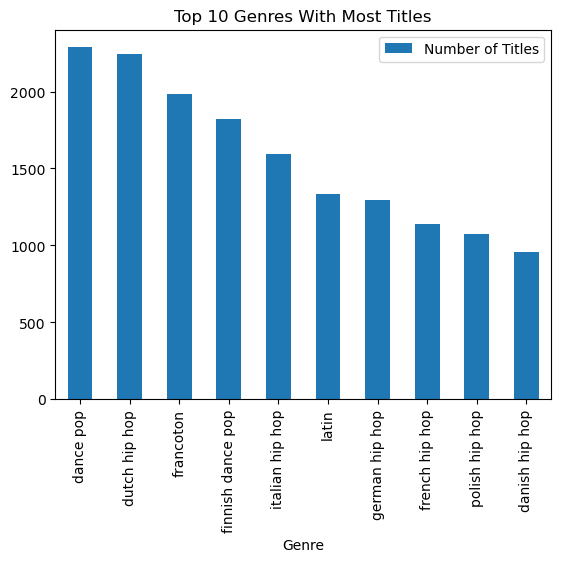

In [17]:
# Top 10 genres with most titles 
titles_df[0:10].plot(x='Genre', y='Num Titles', kind='bar', label = "Number of Titles") 
plt.title("Top 10 Genres With Most Titles")
plt.xticks(rotation = 90)
plt.legend()
plt.show()

**Most popular artist in each country?**

In [18]:
countries = df.Country.unique()
popular_artists = []
for country in countries:
    country_df = df[df['Country']==country]
    # most common artist in the country
    popular_artists.append(country_df.Artist.mode()[0])
popular_artists_by_country = pd.DataFrame({"Country":countries, "Most Popular Artist":popular_artists})
popular_artists_by_country 

,Country,Most Popular Artist
0,Global,Drake
1,USA,Future
2,Argentina,BTS
3,Belgium,Ninho
4,Switzerland,Luciano
5,Chile,BTS
6,Colombia,BTS
7,Costa Rica,Ariana Grande
8,Germany,Ufo361
9,Ecuador,BTS


In [19]:
len(popular_artists_by_country[popular_artists_by_country['Most Popular Artist']=='BTS'])

12

**Songs by decade**

In [20]:
df['Release_date']

0         2018-11-05
1         2018-11-05
2         2018-11-05
3         2018-11-05
4         2018-11-05
             ...    
170628    2017-07-07
170629    2019-12-26
170630    2017-06-28
170631    2012-11-20
170632    2017-07-11
Name: Release_date, Length: 170633, dtype: object

In [21]:
df['Release_date'] = pd.to_datetime(df['Release_date'])
df['year'] = pd.DatetimeIndex(df['Release_date']).year
# datetime.strptime(df['Release_date'], '%y/%m/%d')

In [22]:
df['Release_date'].min(), df['Release_date'].max(), df['Release_date'].median(), df['Release_date'].mode()

(Timestamp('1899-12-31 00:00:00'),
 Timestamp('2020-11-05 00:00:00'),
 Timestamp('2018-07-20 00:00:00'),
 0   2018-06-29
 Name: Release_date, dtype: datetime64[ns])

In [23]:
len(df[df['Release_date']<"2017-01-01 00:00:00"])

28302

In [24]:
df[df['Release_date']<"2017-01-01 00:00:00"].groupby('year').size()

year
1899.0       1
1900.0       1
1929.0       1
1939.0       3
1942.0      31
          ... 
2012.0    1046
2013.0    1394
2014.0    1383
2015.0    2749
2016.0    8341
Length: 75, dtype: int64

In [26]:
year_df = df[df['year']>2000]
songs_per_years = year_df['year'].value_counts().sort_index()
iplot(px.bar(songs_per_years, 
       title='Number of songs per year', 
       text_auto='.2s',
       labels=dict(index='year',value='number of songs')).update_xaxes(type='category'))

In [27]:
for feature in df_info['Features']:
    print(feature)

Country
Uri
Popularity
Title
Artist
Album/Single
Genre
Artist_followers
Explicit
Album
Release_date
Track_number
Tracks_in_album
danceability
energy
key
loudness
mode
speechiness
acoustics
instrumentalness
liveliness
valence
tempo
duration_ms
time_signature
Genre_new
Days_since_release
Released_after_2017
Explicit_false
Explicit_true
album
compilation
single
bolero
boy band
country
dance/electronic
else
funk
hip hop
house
indie
jazz
k-pop
latin
metal
opm
pop
r&b/soul
rap
reggae
reggaeton
rock
trap
syuzhet_norm
bing_norm
afinn_norm
nrc_norm
syuzhet
bing
afinn
nrc
anger
anticipation
disgust
fear
joy
sadness
surprise
trust
negative
positive
n_words
anger_norm
anticipation_norm
disgust_norm
fear_norm
joy_norm
sadness_norm
surprise_norm
trust_norm
negative_norm
positive_norm
anger_norm2
anticipation_norm2
disgust_norm2
fear_norm2
joy_norm2
sadness_norm2
surprise_norm2
trust_norm2
negative_norm2
positive_norm2
negative_bog_jr
positive_bog_jr
Bayes
Negative_Bayes
Neutral_Bayes
Positive_Bayes


In [28]:
df_info[df_info['Features'].isin(['Popularity', 'danceability'])]

,Features,Dtype,Non-Null Values
2,Popularity,float64,170633
13,danceability,object,170633


In [29]:
for i in df['danceability'].unique():
    print(i)

0.767
0.5720000000000001
0.488
0.515
0.593
0.8270000000000001
0.338
0.578
0.602
0.669
0.821
0.591
0.733
0.5820000000000001
0.611
0.7809999999999999
0.679
0.483
0.63
0.723
0.807
0.667
0.479
0.647
0.573
0.65
0.763
0.8540000000000001
0.735
0.598
0.606
0.8170000000000001
0.917
0.489
0.271
0.813
0.797
0.7290000000000001
0.448
0.561
0.8079999999999999
0.579
0.79
0.513
0.6459999999999999
0.387
0.54
0.585
0.848
0.746
0.68
0.721
0.451
0.88
0.773
0.841
0.857
0.568
0.625
0.754
0.81
0.648
0.752
0.745
0.5660000000000001
0.574
0.522
0.69
0.586
0.778
0.402
0.867
0.6779999999999999
0.512
0.696
0.911
0.35600000000000004
0.6859999999999999
0.657
0.633
0.7490000000000001
0.774
0.7759999999999999
0.785
0.8009999999999999
0.49
0.8440000000000001
0.755
0.6890000000000001
0.37
0.675
0.7120000000000001
0.758
0.73
0.424
0.825
0.51
0.4270000000000001
0.596
0.7659999999999999
0.629
0.6579999999999999
0.363
0.487
0.5670000000000001
0.883
0.6
0.649
0.718
0.845
0.736
0.546
0.7509999999999999
0.583
0.614
0.74
0.462


In [30]:
df[df['danceability']=='n']

,Country,Uri,Popularity,Title,Artist,Album/Single,Genre,Artist_followers,Explicit,Album,...,Switzerland,Taiwan,Turkey,UK,USA,Popu_max,Top10_dummy,Top50_dummy,Cluster,year
91956,UK,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,17.60,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,0,0,0,1,0,179,0.0,0.0,english speaking and nordic,2017.0
91957,Austria,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,40.00,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,0,0,0,0,0,151,0.0,0.0,english speaking and nordic,2017.0
91958,Belgium,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,100.30,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,0,0,0,0,0,83,0.0,0.0,english speaking and nordic,2017.0
91959,Switzerland,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,106.25,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,1,0,0,0,0,76,0.0,0.0,english speaking and nordic,2017.0
91960,Denmark,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,3.20,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,0,0,0,0,0,197,0.0,0.0,english speaking and nordic,2017.0
91961,Spain,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,7.20,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,0,0,0,0,0,192,0.0,0.0,spanish speaking,2017.0
91962,Indonesia,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,11.20,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,0,0,0,0,0,187,0.0,0.0,southern europe and portuguese heritage,2017.0
91963,Ireland,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,36.80,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,0,0,0,0,0,155,0.0,0.0,english speaking and nordic,2017.0
91964,Netherlands,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,69.60,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,0,0,0,0,0,114,0.0,0.0,english speaking and nordic,2017.0
91965,Norway,https://open.spotify.com/track/3uMIfxV8q5tPTWz...,49.60,one love manchester - live from one love manch...,Various Artists,compilation,NaN,1029362.0,False,One Love Manchester (Live from One Love Manche...,...,0,0,0,0,0,139,0.0,0.0,english speaking and nordic,2017.0


In [84]:
df = df.replace("n", np.nan)

In [32]:
df['danceability'] = pd.to_numeric(df['danceability'])

In [33]:
df['Popularity'].corr(df['danceability'])

0.0785721887043727

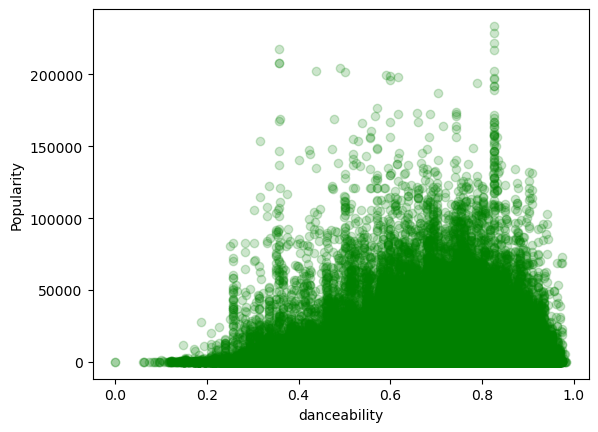

In [34]:
plt.scatter(df['danceability'], df['Popularity'], alpha = 0.2, color = 'green')
plt.xlabel("danceability")
plt.ylabel("Popularity")
plt.show() 

In [35]:
artists = df['Artist'].value_counts()
artists

Ariana Grande                    1487
Drake                            1473
BTS                              1376
Taylor Swift                     1285
XXXTENTACION                      989
                                 ... 
SNAP!                               1
Soulé - C Cane                      1
RuthAnne                            1
Lewis Capaldi - Future Humans       1
ONE                                 1
Name: Artist, Length: 25523, dtype: int64

In [36]:
iplot(px.pie(names=['1 song', '>1 songs'], 
       values=[len(artists.loc[lambda x:x==1]), 
          len(artists)-len(artists.loc[lambda x:x==1])
         ],
       title="Artists with 1 top hit VS Artists with >1 top hit",
       color_discrete_sequence=['green','lightgreen']
      ).update_traces(textinfo='label+percent'))

In [37]:
artist_df = df[['Artist', 'Popularity']].groupby('Artist').mean().sort_values(by='Artist')
artists = artists.sort_index()
artist_df['total songs'] = artists.values
artist_df.sort_values(by='total songs',ascending=False, inplace=True)
artist_df.reset_index(inplace=True)
artist_df[:10]

,Artist,Popularity,total songs
0,Ariana Grande,5463.851614,1487
1,Drake,5532.845621,1473
2,BTS,1603.025654,1376
3,Taylor Swift,2319.853619,1285
4,XXXTENTACION,6320.054247,989
5,Ed Sheeran,18188.312569,911
6,The Weeknd,5837.698354,881
7,Linkin Park,464.085025,798
8,Eminem,1661.252608,786
9,Billie Eilish,11124.157593,777


In [38]:
iplot(px.scatter(artist_df[:10], 
           x='Artist', 
           y='Popularity', 
           size='total songs',
           size_max=25,
           color='Popularity',
           title='Top 10 artists (based on number of songs) vs average popularity of their top hits',
           hover_name='total songs'
          ))

In [39]:
artist_df = df[['Artist', 'danceability']].groupby('Artist').mean().sort_values(by='Artist')
artists = artists.sort_index()
artist_df['total songs'] = artists.values
artist_df.sort_values(by='total songs',ascending=False, inplace=True)
artist_df.reset_index(inplace=True)
artist_df[:10]

iplot(px.scatter(artist_df[:10], 
           x='Artist', 
           y='danceability', 
           size='total songs',
           size_max=25,
           color='danceability',
           title='Top 10 artists (based on number of songs) vs average danceability of their top hits',
           hover_name='total songs'
          ))

In [40]:
iplot(px.pie(df['Explicit'].value_counts().reset_index(), 
       values='Explicit', 
       names=['Clean', 'Explicit'],
       title='Explicit or not?',
       color_discrete_sequence = ['cornflowerblue', 'crimson']
      ).update_traces(textinfo='label+percent'))

In [41]:
iplot(px.pie(df['key'].value_counts().reset_index(), 
       names=r'C C♯/D♭ D E♭/D♯ E F F♯/G♭ G A♭/G♯ A B♭/A♯ B'.split(), 
       values='key',
       color_discrete_sequence = px.colors.qualitative.Set3,
       title='Key Distribution'
      ).update_traces(textinfo='label+percent'))

In [42]:
df['key'].unique()
## Key Range - 
# C C♯/D♭ D E♭/D♯ E F F♯/G♭ G A♭/G♯ A B♭/A♯ B
# 0 1     2 3.    4 5 6.    7 8.   9.  10.  11 

array(['1', '6', '2', '7', '8', '10', '0', '4', '11', '9', '5', '3', nan],
      dtype=object)

In [43]:
from plotly.subplots import make_subplots

histogram_labels = ['Popularity',
                    'danceability', 
                    'energy'
                   ]

colors = px.colors.qualitative.Vivid
for i in range(len(histogram_labels)):
    fig = px.histogram(df, 
                       histogram_labels[i], 
                       title=f'{histogram_labels[i]} distribution in top hits', 
                       height=400, 
                       width=500,
                       color_discrete_sequence=[colors[i]]
                      )
    iplot(fig)

In [44]:
spotify_api_data = df[['Country', 'Uri', 'Popularity',
"Title","Artist","Album/Single","Genre","Artist_followers","Explicit","Album",
"Release_date","Track_number","Tracks_in_album","danceability","energy","key","loudness","mode","speechiness",
"acoustics","instrumentalness","liveliness","valence","tempo","duration_ms","time_signature","Genre_new",
"Days_since_release","Released_after_2017","Explicit_false","Explicit_true","album","compilation"]]

In [45]:
spotify_api_data

,Country,Uri,Popularity,Title,Artist,Album/Single,Genre,Artist_followers,Explicit,Album,...,tempo,duration_ms,time_signature,Genre_new,Days_since_release,Released_after_2017,Explicit_false,Explicit_true,album,compilation
0,Global,https://open.spotify.com/track/6FyRXC8tJUh863J...,31833.95,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,171.993,258639,4,hip hop,740.0,1.0,1,0,0,0
1,USA,https://open.spotify.com/track/6FyRXC8tJUh863J...,8.00,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,171.993,258639,4,hip hop,740.0,1.0,1,0,0,0
2,Argentina,https://open.spotify.com/track/6FyRXC8tJUh863J...,76924.40,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,171.993,258639,4,hip hop,740.0,1.0,1,0,0,0
3,Belgium,https://open.spotify.com/track/6FyRXC8tJUh863J...,849.60,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,171.993,258639,4,hip hop,740.0,1.0,1,0,0,0
4,Switzerland,https://open.spotify.com/track/6FyRXC8tJUh863J...,20739.10,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,171.993,258639,4,hip hop,740.0,1.0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170628,Taiwan,https://open.spotify.com/track/4v29A51TqtD2KFS...,31.20,smalltown,Luke Christopher,single,indie pop rap,152740.0,True,SmallTown,...,79.97399999999998,140825,4,pop,1226.0,1.0,0,1,0,0
170629,Taiwan,https://open.spotify.com/track/7InvbALrXpsz58J...,156.00,灰狼,G.E.M.,album,mandopop,1225408.0,False,摩天動物園,...,133.951,203418,4,pop,324.0,1.0,1,0,1,0
170630,Taiwan,https://open.spotify.com/track/5rCNIuDc3VD7q6H...,90.40,預念患者,張赫宣,album,NaN,38.0,False,Freedom,...,131.917,309526,4,else,1235.0,1.0,1,0,1,0
170631,Taiwan,https://open.spotify.com/track/0525Cll5exsrybt...,21.60,清晨巴士,Crowd Lu,album,chinese indie,149875.0,False,有吉他的流行歌曲,...,66.53699999999999,264480,4,indie,2907.0,0.0,1,0,1,0


In [46]:
len(spotify_api_data['Uri'].unique()), spotify_api_data.shape[0]

(62420, 170633)

In [47]:
spotify_api_data['Uri']

0         https://open.spotify.com/track/6FyRXC8tJUh863J...
1         https://open.spotify.com/track/6FyRXC8tJUh863J...
2         https://open.spotify.com/track/6FyRXC8tJUh863J...
3         https://open.spotify.com/track/6FyRXC8tJUh863J...
4         https://open.spotify.com/track/6FyRXC8tJUh863J...
                                ...                        
170628    https://open.spotify.com/track/4v29A51TqtD2KFS...
170629    https://open.spotify.com/track/7InvbALrXpsz58J...
170630    https://open.spotify.com/track/5rCNIuDc3VD7q6H...
170631    https://open.spotify.com/track/0525Cll5exsrybt...
170632    https://open.spotify.com/track/6IUFuke9UsBg2FD...
Name: Uri, Length: 170633, dtype: object

In [60]:
df['Country'].value_counts()

Switzerland    7686
Taiwan         7594
Sweden         6970
Germany        6942
Finland        6783
Netherlands    6697
USA            6645
UK             6540
Austria        6530
France         6449
Norway         6074
Belgium        6038
Canada         5635
Global         5461
Ireland        5371
Poland         5273
Denmark        5234
Italy          5219
Portugal       4589
Spain          4288
Australia      4034
Malaysia       3902
Singapore      3623
New Zealand    3591
Chile          3500
Turkey         3365
Brazil         3318
Colombia       3216
Indonesia      3070
Argentina      3021
Costa Rica     2975
Mexico         2833
Philippines    2806
Peru           2701
Ecuador        2660
Name: Country, dtype: int64

In [61]:
df[df['Country']=="USA"]

,Country,Uri,Popularity,Title,Artist,Album/Single,Genre,Artist_followers,Explicit,Album,...,Sweden,Switzerland,Taiwan,Turkey,UK,USA,Popu_max,Top10_dummy,Top50_dummy,Cluster
1,USA,https://open.spotify.com/track/6FyRXC8tJUh863J...,8.00,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,...,0,0,0,0,0,1,191,0.0,0.0,english speaking and nordic
17,USA,https://open.spotify.com/track/5xhJmd0I15jFcEd...,581.20,it wont kill ya,The Chainsmokers - Louane,album,dance pop,16931568.0,False,Memories...Do Not Open,...,0,0,0,0,0,1,55,0.0,0.0,english speaking and nordic
40,USA,https://open.spotify.com/track/0wJJhRgdHhT93Z3...,100.25,hymn,Kesha,single,dance pop,5910376.0,True,Hymn,...,0,0,0,0,0,1,100,0.0,0.0,english speaking and nordic
59,USA,https://open.spotify.com/track/6JSryEdVJTZq6YB...,56.00,arrows,Foo Fighters,album,alternative metal,8092392.0,False,Concrete and Gold,...,0,0,0,0,0,1,131,0.0,0.0,english speaking and nordic
81,USA,https://open.spotify.com/track/7nAfXgeHfDO50up...,62.40,talking to myself,Linkin Park,album,alternative metal,17132813.0,False,One More Light,...,0,0,0,0,0,1,123,0.0,0.0,english speaking and nordic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89416,USA,https://open.spotify.com/track/0JnSoyZMTYZLWFV...,247.20,you were good to me,Jeremy Zucker - Chelsea Cutler,album,pop,1262102,False,love is not dying,...,0,0,0,0,0,1,144,0.0,0.0,english speaking and nordic
89422,USA,https://open.spotify.com/track/49VzL5oBsUICN7U...,28.00,instinct,Roy Woods - MadeinTYO,album,canadian contemporary r&b,711265,True,Nocturnal,...,0,0,0,0,0,1,188,0.0,0.0,english speaking and nordic
89423,USA,https://open.spotify.com/track/0lSFDvmV2HZqrtV...,364.65,black spiderman,Logic - Damian Lemar Hudson,single,conscious hip hop,5004777,True,Black SpiderMan,...,0,0,0,0,0,1,92,0.0,0.0,english speaking and nordic
89424,USA,https://open.spotify.com/track/55OdqrG8WLmsYyY...,4919.35,wyclef jean,Young Thug,album,atl hip hop,5647016,True,JEFFERY,...,0,0,0,0,0,1,91,0.0,0.0,english speaking and nordic


In [ ]:
# Distribution of target variable 
# Explicit content vs non-explicit with respect to target variable 
# Scale the target variable? 

In [63]:
df['Popularity'].min(), df['Popularity'].max()

(0.8, 233766.89999999988)

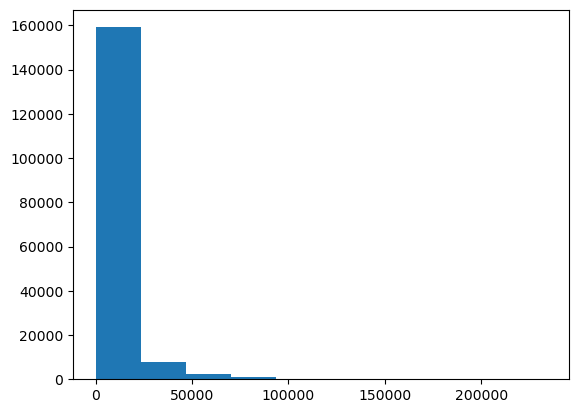

In [75]:
plt.hist(df['Popularity']) 
plt.show()

In [69]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df['target'] = scaler.fit_transform(df[['Popularity']])

In [73]:
df['target'].min(), df['target'].max()

(0.0, 1.0)

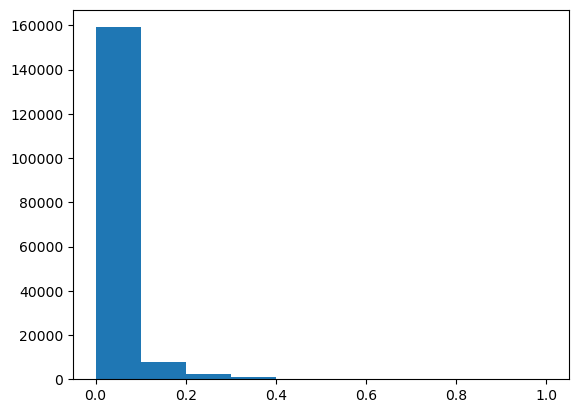

In [78]:
plt.hist(df['target'])
plt.show()

In [81]:
df['time_signature'].unique()

array(['4', '3', '5', '1', 'n\x07', '0'], dtype=object)

In [85]:
df['duration_min'] = pd.to_numeric(df['duration_ms'])/60000

In [87]:
df[['duration_ms', 'duration_min']]

,duration_ms,duration_min
0,258639,4.310650
1,258639,4.310650
2,258639,4.310650
3,258639,4.310650
4,258639,4.310650
...,...,...
170628,140825,2.347083
170629,203418,3.390300
170630,309526,5.158767
170631,264480,4.408000


<AxesSubplot:xlabel='Popularity', ylabel='Density'>

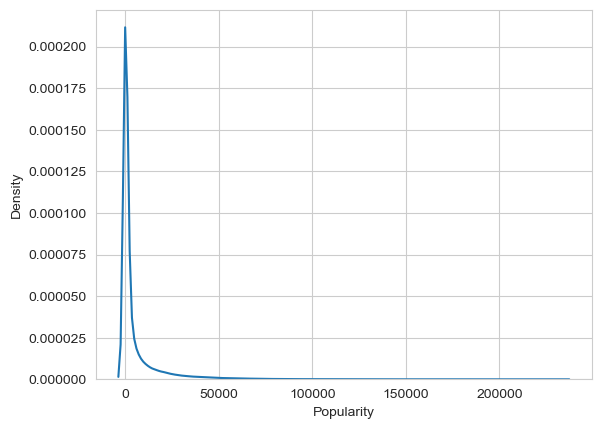

In [90]:
sb.set_style('whitegrid')
sb.kdeplot(df['Popularity'])

In [91]:
df['Popularity'].describe()

count    170633.000000
mean       5417.616264
std       13115.854526
min           0.800000
25%          77.600000
50%         515.150000
75%        3867.850000
max      233766.900000
Name: Popularity, dtype: float64

In [92]:
usa_df = df[df['Country']=='USA']
usa_df['Popularity'].describe()

count      6645.000000
mean       3951.225500
std       10946.381755
min           0.800000
25%          76.800000
50%         373.250000
75%        2275.700000
max      140487.550000
Name: Popularity, dtype: float64

In [93]:
len(df[df['Popularity']<=100])

48825

In [2]:
fig = sb.histplot(usa_df['Popularity'], bins = 50,color="r")
plt.title("Visualizing the Target Variable = Popularity")
txt="Popularity scores lie between 0 to 100. This histogram showcases the distribution of scores across the entire dataset"
plt.figtext(0.5, -0.05, txt, wrap=True, horizontalalignment='center', fontsize=12)
# plt.savefig("archive/usa_popularity_scores_distribution.png", bbox_inches="tight")

NameError: name 'sb' is not defined

In [14]:
df = df.replace("'n\x07'", np.nan)
df = df.replace("n", np.nan)
df['mode'] = pd.to_numeric(df['mode'])

Text(0.5, -0.05, 'Based on the mode, the same key can produce different popularity scores')

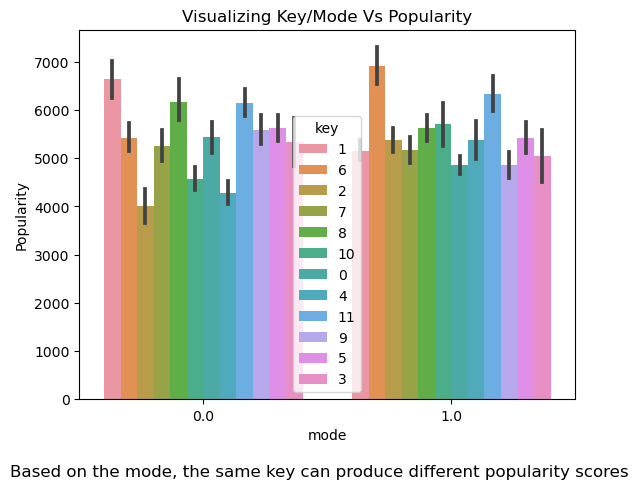

In [15]:
sb.barplot(x = 'mode', y = 'Popularity', hue = 'key', data = df)
plt.title("Visualizing Key/Mode Vs Popularity")
txt="Based on the mode, the same key can produce different popularity scores"
plt.figtext(0.5, -0.05, txt, wrap=True, horizontalalignment='center', fontsize=12)
# plt.savefig("archive/popularity_based_on_key.png", bbox_inches="tight")

In [11]:
df['mode'].unique()

array(['1', '0', 'n\x07'], dtype=object)